In [ ]:
#Importing necessary modules for EDA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#Reading the dataset for comments
comments=pd.read_csv('UScomments.csv',error_bad_lines=False, quoting=3, encoding='utf-8')

b'Skipping line 13: expected 4 fields, saw 5\nSkipping line 18: expected 4 fields, saw 6\nSkipping line 24: expected 4 fields, saw 6\nSkipping line 37: expected 4 fields, saw 6\nSkipping line 47: expected 4 fields, saw 5\nSkipping line 54: expected 4 fields, saw 5\nSkipping line 55: expected 4 fields, saw 5\nSkipping line 65: expected 4 fields, saw 5\nSkipping line 68: expected 4 fields, saw 5\nSkipping line 93: expected 4 fields, saw 5\nSkipping line 103: expected 4 fields, saw 12\nSkipping line 108: expected 4 fields, saw 7\nSkipping line 112: expected 4 fields, saw 5\nSkipping line 115: expected 4 fields, saw 6\nSkipping line 118: expected 4 fields, saw 5\nSkipping line 121: expected 4 fields, saw 5\nSkipping line 122: expected 4 fields, saw 5\nSkipping line 124: expected 4 fields, saw 5\nSkipping line 127: expected 4 fields, saw 5\nSkipping line 128: expected 4 fields, saw 10\nSkipping line 130: expected 4 fields, saw 5\nSkipping line 132: expected 4 fields, saw 9\nSkipping line 13

In [ ]:
#Looking at some samples
comments.head()

,video_id,comment_text,likes,replies
0,XpVt6Z1Gjjo,"""Logan Paul it's yo big day ‼️‼️‼️""",4,0
1,XpVt6Z1Gjjo,"""I've been following you from the start of you...",3,0
2,XpVt6Z1Gjjo,"""Say hi to Kong and maverick for me""",3,0
3,XpVt6Z1Gjjo,"""MY FAN . attendance""",3,0
4,XpVt6Z1Gjjo,"""trending 😉""",3,0


In [ ]:
len(comments)

419275

#### sentiment analysis of youtube_comments

In [ ]:
#Installing Library for Sentiment Analysis
!pip install textblob

In [ ]:
#Importing the specific package for Sentiment Analysis
from textblob import TextBlob

In [ ]:
#Testing with a sample data
TextBlob("I've been following you from the start of you.").sentiment.polarity

0.0

In [ ]:
#Looking at the number of null cells
comments.isna().sum()

In [ ]:
#Dropping the null cells
comments.dropna(inplace=True)

In [ ]:
polarity=[] # list which will contain the polarity of the comments
#Appending each sentiment score to the list
for i in comments['comment_text']:
    polarity.append(TextBlob(i).sentiment.polarity)

In [ ]:
#Adding a new column to the dataframe
comments['polarity']=polarity

In [ ]:
comments.head(20)

,video_id,comment_text,likes,replies,polarity
0,XpVt6Z1Gjjo,"""Logan Paul it's yo big day ‼️‼️‼️""",4,0,0.000000
1,XpVt6Z1Gjjo,"""I've been following you from the start of you...",3,0,0.000000
2,XpVt6Z1Gjjo,"""Say hi to Kong and maverick for me""",3,0,0.000000
3,XpVt6Z1Gjjo,"""MY FAN . attendance""",3,0,0.000000
4,XpVt6Z1Gjjo,"""trending 😉""",3,0,0.000000
5,XpVt6Z1Gjjo,"""#1 on trending AYYEEEEE""",3,0,0.000000
6,XpVt6Z1Gjjo,"""The end though 😭👍🏻❤️""",4,0,0.000000
7,XpVt6Z1Gjjo,"""#1 trending!!!!!!!!!""",3,0,0.000000
8,XpVt6Z1Gjjo,"""Happy one year vlogaversary""",3,0,0.800000
9,XpVt6Z1Gjjo,"""You and your shit brother may have single han...",0,0,-0.135714


#### Lets perform EDA for the Positve sentences

In [ ]:
#Selecting all the positive sentiment comments
comments_positive=comments[comments['polarity']==1]

In [ ]:
#printing the shape of the positive sentiment comments list
comments_positive.shape

(12879, 5)

In [ ]:
comments_positive.head()

,video_id,comment_text,likes,replies,polarity
56,XpVt6Z1Gjjo,"""yu are the best""",1,0,1.0
124,cLdxuaxaQwc,"""Power is the disease. Care is the cure. Kee...",0,0,1.0
182,WYYvHb03Eog,"""YAS Can't wait to get it! I just need to sell...",0,0,1.0
246,sjlHnJvXdQs,"""This is priceless""",0,0,1.0
258,sjlHnJvXdQs,"""Summed up perfectly""",0,0,1.0


In [ ]:
#Installing module for textual data visualisation
!pip install wordcloud

In [ ]:
#Importing the specific packages as per our requirements
from wordcloud import WordCloud,STOPWORDS

In [ ]:
#Removing duplicate Stopwords
stopwords=set(STOPWORDS)

In [ ]:
#Joining all the comments from different instances to a single body of text
total_comments=' '.join(comments_positive['comment_text'])

In [ ]:
#Calling the WordCloud method on our text file
wordcloud=WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_comments)

(-0.5, 999.5, 499.5, -0.5)

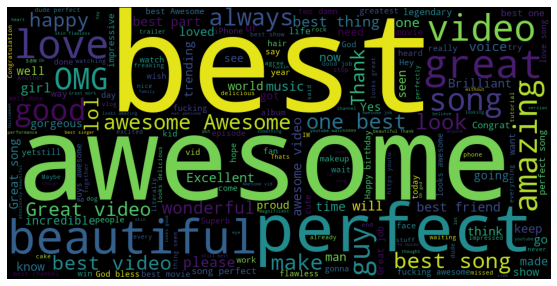

In [ ]:
#Plotting the Wordcloud for the positive sentiment words
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

#### Its time to go for negative sentences


In [ ]:
comments_negative=comments[comments['polarity']==-1]

In [ ]:
total_comments=' '.join(comments_negative['comment_text'])

In [ ]:
wordcloud=WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_comments)

(-0.5, 999.5, 499.5, -0.5)

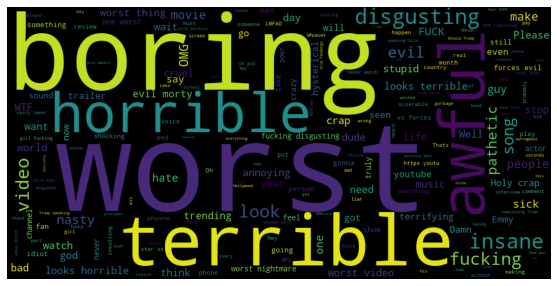

In [ ]:
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

### Analysing Tags column,what are trending tags on youtube

In [ ]:
#Importing the USvideos dataset
videos=pd.read_csv('GBvideos.csv',error_bad_lines=False)

b'Skipping line 2398: expected 11 fields, saw 21\nSkipping line 2797: expected 11 fields, saw 21\n'


In [ ]:
videos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,thumbnail_link,date
0,jt2OHQh0HoQ,Live Apple Event - Apple September Event 2017 ...,Apple Event,28,apple events|apple event|iphone 8|iphone x|iph...,7426393,78240,13548,705,https://i.ytimg.com/vi/jt2OHQh0HoQ/default_liv...,13.09
1,AqokkXoa7uE,Holly and Phillip Meet Samantha the Sex Robot ...,This Morning,24,this morning|interview|holly willoughby|philli...,494203,2651,1309,0,https://i.ytimg.com/vi/AqokkXoa7uE/default.jpg,13.09
2,YPVcg45W0z4,My DNA Test Results! I'm WHAT?!,emmablackery,24,emmablackery|emma blackery|emma|blackery|briti...,142819,13119,151,1141,https://i.ytimg.com/vi/YPVcg45W0z4/default.jpg,13.09
3,T_PuZBdT2iM,getting into a conversation in a language you ...,ProZD,1,skit|korean|language|conversation|esl|japanese...,1580028,65729,1529,3598,https://i.ytimg.com/vi/T_PuZBdT2iM/default.jpg,13.09
4,NsjsmgmbCfc,Baby Name Challenge!,Sprinkleofglitter,26,sprinkleofglitter|sprinkle of glitter|baby gli...,40592,5019,57,490,https://i.ytimg.com/vi/NsjsmgmbCfc/default.jpg,13.09


In [ ]:
#Extracting the tags
tags_complete=' '.join(videos['tags'])

In [ ]:
tags_complete

"apple events|apple event|iphone 8|iphone x|iphone 8 plus|iphone 7s|iphone 7s plus|ios 11 this morning|interview|holly willoughby|phillip schofield|ruth langsford|eamonn holmes|chat shows - topic|chat show - topic|talk shows - topic|sex robot|samantha|real life emmablackery|emma blackery|emma|blackery|british vlogger|british youtuber|female vlogger|birdyboots|dna test|23andme|ancestry skit|korean|language|conversation|esl|japanese|foreign|communication|don't speak|struggle|foreigner|lotte mart|korea|south|weather|good|tutorial sprinkleofglitter|sprinkle of glitter|baby glitter|Louise Pentland|Louise Pentland Baby Name|Mrs Meldrum|Baby Names|Nice baby names|Unusual baby names Rio Ferdinand|Rio|Ferdinand|5 Magazine|5 Mag|#5|5 Rio Ferdinand|Rio Ferdinand interview|football|soccer|interview|Manchester United|Man United|fifa 18|fut 18|fut|fifa ratings|fifa 18 ratings|chelsea|chelsea fc|chelsea f.c|David Luiz|Eden Hazard|Christensen|Premier League|Champions League|Fifa18|Hazard Fifa 18|David

In [ ]:
#Importing Package for regular expression
import re

In [ ]:
#Replacing the characters other then the alphabets to space
tags=re.sub('[^a-zA-Z]',' ',tags_complete)

In [ ]:
tags

'apple events apple event iphone   iphone x iphone   plus iphone  s iphone  s plus ios    this morning interview holly willoughby phillip schofield ruth langsford eamonn holmes chat shows   topic chat show   topic talk shows   topic sex robot samantha real life emmablackery emma blackery emma blackery british vlogger british youtuber female vlogger birdyboots dna test   andme ancestry skit korean language conversation esl japanese foreign communication don t speak struggle foreigner lotte mart korea south weather good tutorial sprinkleofglitter sprinkle of glitter baby glitter Louise Pentland Louise Pentland Baby Name Mrs Meldrum Baby Names Nice baby names Unusual baby names Rio Ferdinand Rio Ferdinand   Magazine   Mag      Rio Ferdinand Rio Ferdinand interview football soccer interview Manchester United Man United fifa    fut    fut fifa ratings fifa    ratings chelsea chelsea fc chelsea f c David Luiz Eden Hazard Christensen Premier League Champions League Fifa   Hazard Fifa    David

In [ ]:
#Replacing more than one space with a single space
tags=re.sub(' +',' ',tags)

In [ ]:
wordcloud=WordCloud(width=1000,height=500,stopwords=set(STOPWORDS)).generate(tags)

(-0.5, 999.5, 499.5, -0.5)

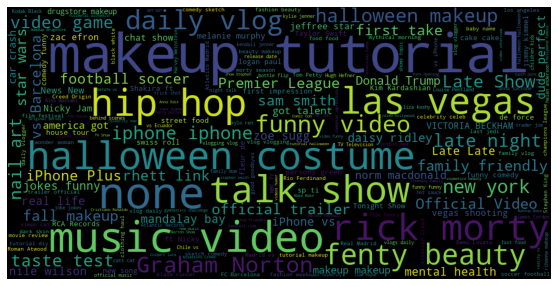

In [ ]:
#Plotting the Word cloud on the tags
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

#### Lets find out the relation among continuous variables
#### As quite obvious the number of likes have very strong relation with views

Text(0.5, 1.0, 'Regression plot for views & likes')

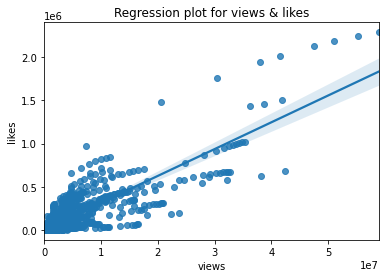

In [ ]:
#Plotting Regression plot for views and likes
sns.regplot(data=videos,x='views',y='likes')
plt.title('Regression plot for views & likes')

#### dislikes vs views Analysis

Text(0.5, 1.0, 'Regression plot for views & dislikes')

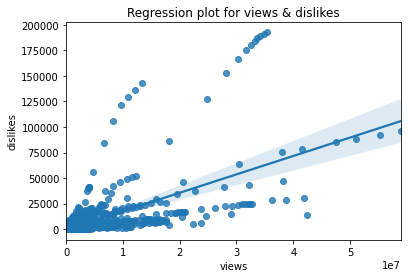

In [ ]:
sns.regplot(data=videos,x='views',y='dislikes')
plt.title('Regression plot for views & dislikes')

#### Correlation matrix is the evidence of above analysis!

In [ ]:
#Defining the columns on which we want to find the coorelation amongst
df_corr=videos[['views','likes','dislikes']]

In [ ]:
df_corr.corr()

,views,likes,dislikes
views,1.000000,0.866249,0.671703
likes,0.866249,1.000000,0.623797
dislikes,0.671703,0.623797,1.000000


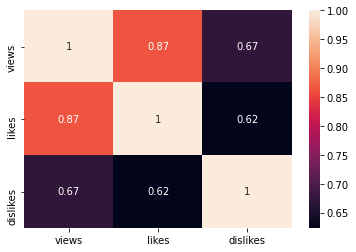

In [ ]:
#Plotting the Heatmap on the coorelation
sns.heatmap(df_corr.corr(),annot=True)

### Analyse Emojis in comments

In [167]:
comments=pd.read_csv('GBcomments.csv',error_bad_lines=False, quoting=3, encoding='utf-8')

b'Skipping line 4: expected 4 fields, saw 5\nSkipping line 11: expected 4 fields, saw 5\nSkipping line 15: expected 4 fields, saw 8\nSkipping line 25: expected 4 fields, saw 37\nSkipping line 27: expected 4 fields, saw 5\nSkipping line 53: expected 4 fields, saw 5\nSkipping line 86: expected 4 fields, saw 6\nSkipping line 92: expected 4 fields, saw 5\nSkipping line 102: expected 4 fields, saw 5\nSkipping line 103: expected 4 fields, saw 6\nSkipping line 104: expected 4 fields, saw 8\nSkipping line 105: expected 4 fields, saw 6\nSkipping line 106: expected 4 fields, saw 7\nSkipping line 110: expected 4 fields, saw 9\nSkipping line 119: expected 4 fields, saw 5\nSkipping line 120: expected 4 fields, saw 7\nSkipping line 125: expected 4 fields, saw 6\nSkipping line 128: expected 4 fields, saw 5\nSkipping line 130: expected 4 fields, saw 5\nSkipping line 133: expected 4 fields, saw 7\nSkipping line 135: expected 4 fields, saw 5\nSkipping line 139: expected 4 fields, saw 5\nSkipping line 14

In [ ]:
comments.head()

,video_id,comment_text,likes,replies
0,jt2OHQh0HoQ,"""It's more accurate to call it the M+ (1000) b...",0,0
1,jt2OHQh0HoQ,"""To be there with a samsung phone\n😂😂😂""",1,0
2,jt2OHQh0HoQ,"""What happened to the home button on the iPhon...",0,0
3,jt2OHQh0HoQ,"""Power is the disease. Care is the cure. Kee...",0,0
4,jt2OHQh0HoQ,"""Keep calm and buy iphone 8 Keep calm and buy ...",0,0


In [ ]:
comments['comment_text'][1]

'"To be there with a samsung phone\\n😂😂😂"'

    Every emoji has a Unicode associated with it
     '\U0001F600' is a unicode for 😀

In [ ]:
print('\U0001F600')

😀


In [ ]:
#Installing the emoji package
!pip install emoji

In [ ]:
import emoji

In [ ]:
len(comments)

407232

In [170]:
comment=comments['comment_text'][1]

In [171]:
comment

'"To be there with a samsung phone\\n😂😂😂"'

In [177]:
!pip install emojis

In [178]:
import emojis

In [179]:
print(emojis.get(comment))

{'😂'}


In [174]:
def split_count(text):

    str = ""
    data = re.findall(r'\X', text)
    print(data)
    for word in data:
        print(word)
        if any(char in emoji.UNICODE_EMOJI for char in word):
            str = str + word

    return str

In [181]:
#Storing the emojis as a string
str=''
for i in comments['comment_text']:
    try:
      list=emojis.get(i)
      for ele in list:
          str=str+ele
    except:
      pass

In [182]:
len(str)

97808

    lets create a dictionary of having each emoji with its frequency as well

In [183]:
#Calculating the frequency
result={}
for i in set(str):
    result[i]=str.count(i)

In [184]:
result

{'#': 1,
 '1': 1,
 '\u200d': 169,
 '‼': 61,
 '⁉': 2,
 '⃣': 2,
 '™': 3,
 '⌚': 12,
 '⌛': 4,
 '⏩': 2,
 '⏪': 5,
 '⏫': 2,
 '⏬': 2,
 '⏰': 3,
 '⏳': 4,
 '▪': 3,
 '▶': 4,
 '◀': 1,
 '◽': 1,
 '◾': 1,
 '☀': 23,
 '☁': 6,
 '☂': 1,
 '☃': 2,
 '☄': 2,
 '☎': 1,
 '☑': 1,
 '☔': 7,
 '☕': 31,
 '☘': 3,
 '☝': 31,
 '☠': 32,
 '☮': 1,
 '☹': 83,
 '☺': 358,
 '♀': 269,
 '♂': 148,
 '♈': 7,
 '♉': 5,
 '♊': 5,
 '♋': 9,
 '♌': 6,
 '♍': 5,
 '♎': 5,
 '♏': 9,
 '♐': 6,
 '♑': 5,
 '♒': 6,
 '♓': 5,
 '♥': 455,
 '♨': 1,
 '♻': 1,
 '♿': 5,
 '⚓': 3,
 '⚔': 2,
 '⚜': 1,
 '⚠': 10,
 '⚡': 51,
 '⚪': 22,
 '⚫': 19,
 '⚰': 7,
 '⚱': 10,
 '⚽': 79,
 '⚾': 1,
 '⛄': 2,
 '⛅': 4,
 '⛈': 1,
 '⛎': 4,
 '⛔': 4,
 '⛪': 3,
 '⛲': 2,
 '⛳': 4,
 '⛵': 7,
 '⛹': 1,
 '⛺': 4,
 '⛽': 6,
 '✂': 3,
 '✅': 31,
 '✈': 7,
 '✊': 102,
 '✋': 57,
 '✌': 70,
 '✍': 1,
 '✏': 1,
 '✔': 13,
 '✖': 12,
 '✝': 10,
 '✨': 506,
 '✳': 7,
 '❄': 37,
 '❌': 18,
 '❎': 1,
 '❓': 16,
 '❔': 5,
 '❕': 8,
 '❗': 45,
 '❣': 125,
 '❤': 6495,
 '➕': 33,
 '➖': 1,
 '➗': 1,
 '➡': 9,
 '➰': 1,
 '➿': 1,
 '⤴': 1,
 '⬅': 1

    sort the emojis according to its count or frequency

In [185]:
result.items()

dict_items([('🏑', 3), ('📚', 12), ('🍒', 18), ('🇮', 52), ('⛅', 4), ('♨', 1), ('🔷', 2), ('🐲', 11), ('💑', 21), ('🚥', 2), ('🐉', 9), ('🎚', 1), ('🌻', 61), ('🦄', 105), ('💥', 123), ('🐅', 8), ('👁', 2), ('🍞', 7), ('⚜', 1), ('🍗', 14), ('🏴', 8), ('💋', 328), ('🙆', 60), ('📸', 6), ('🔹', 1), ('🈳', 1), ('💄', 108), ('🎶', 270), ('🐬', 13), ('🕦', 3), ('🍘', 2), ('👰', 18), ('⚾', 1), ('🇶', 4), ('♊', 5), ('🚱', 2), ('🚤', 2), ('🍊', 12), ('🕞', 3), ('📗', 4), ('👉', 78), ('👏', 1277), ('🌟', 52), ('⛳', 4), ('🎺', 15), ('🥉', 2), ('❔', 5), ('🛁', 2), ('😉', 470), ('🐥', 8), ('🎇', 13), ('⏰', 3), ('🏫', 4), ('☹', 83), ('🎴', 4), ('🏪', 2), ('✂', 3), ('💝', 184), ('\u200d', 169), ('🤡', 74), ('👢', 12), ('🆗', 8), ('🎢', 7), ('♿', 5), ('✋', 57), ('📔', 4), ('💘', 266), ('🕝', 4), ('😘', 1842), ('👮', 8), ('🚷', 6), ('🍑', 28), ('🐔', 12), ('🌗', 2), ('🏅', 12), ('🆕', 1), ('😜', 282), ('🍐', 3), ('🥅', 2), ('💺', 4), ('🐰', 15), ('🌒', 4), ('🙎', 7), ('📎', 4), ('🐭', 11), ('🐪', 7), ('🤧', 31), ('🎈', 159), ('🔛', 3), ('🤞', 30), ('🥞', 1), ('▶', 4), ('⚰', 7),

In [186]:
#Sorting the dict as per the frequency of their occurences
final={}
for key,value in sorted(result.items(),key =lambda item:item[1]):
    final[key]=value

In [187]:
final

{'#': 1,
 '1': 1,
 '\u200d': 169,
 '‼': 61,
 '⁉': 2,
 '⃣': 2,
 '™': 3,
 '⌚': 12,
 '⌛': 4,
 '⏩': 2,
 '⏪': 5,
 '⏫': 2,
 '⏬': 2,
 '⏰': 3,
 '⏳': 4,
 '▪': 3,
 '▶': 4,
 '◀': 1,
 '◽': 1,
 '◾': 1,
 '☀': 23,
 '☁': 6,
 '☂': 1,
 '☃': 2,
 '☄': 2,
 '☎': 1,
 '☑': 1,
 '☔': 7,
 '☕': 31,
 '☘': 3,
 '☝': 31,
 '☠': 32,
 '☮': 1,
 '☹': 83,
 '☺': 358,
 '♀': 269,
 '♂': 148,
 '♈': 7,
 '♉': 5,
 '♊': 5,
 '♋': 9,
 '♌': 6,
 '♍': 5,
 '♎': 5,
 '♏': 9,
 '♐': 6,
 '♑': 5,
 '♒': 6,
 '♓': 5,
 '♥': 455,
 '♨': 1,
 '♻': 1,
 '♿': 5,
 '⚓': 3,
 '⚔': 2,
 '⚜': 1,
 '⚠': 10,
 '⚡': 51,
 '⚪': 22,
 '⚫': 19,
 '⚰': 7,
 '⚱': 10,
 '⚽': 79,
 '⚾': 1,
 '⛄': 2,
 '⛅': 4,
 '⛈': 1,
 '⛎': 4,
 '⛔': 4,
 '⛪': 3,
 '⛲': 2,
 '⛳': 4,
 '⛵': 7,
 '⛹': 1,
 '⛺': 4,
 '⛽': 6,
 '✂': 3,
 '✅': 31,
 '✈': 7,
 '✊': 102,
 '✋': 57,
 '✌': 70,
 '✍': 1,
 '✏': 1,
 '✔': 13,
 '✖': 12,
 '✝': 10,
 '✨': 506,
 '✳': 7,
 '❄': 37,
 '❌': 18,
 '❎': 1,
 '❓': 16,
 '❔': 5,
 '❕': 8,
 '❗': 45,
 '❣': 125,
 '❤': 6495,
 '➕': 33,
 '➖': 1,
 '➗': 1,
 '➡': 9,
 '➰': 1,
 '➿': 1,
 '⤴': 1,
 '⬅': 1

In [188]:
## convert dictionary into list for this we have to unzip this dictionary
keys=[*final.keys()]

In [189]:
keys

['♨',
 '🎚',
 '⚜',
 '🔹',
 '🈳',
 '⚾',
 '🆕',
 '🥞',
 '🥘',
 '⤴',
 '🚃',
 '🔓',
 '🔘',
 '🔈',
 '🈯',
 '🌶',
 '🔄',
 '🔢',
 '🉑',
 '🚏',
 '☑',
 '⛹',
 '🈵',
 '🛒',
 '🚇',
 '🏥',
 '🎽',
 '🔡',
 '🥖',
 '🚐',
 '🔙',
 '🏧',
 '🈹',
 '📶',
 '➰',
 '🈺',
 '🥈',
 '🛩',
 '🔖',
 '🏔',
 '🔼',
 '☂',
 '🚠',
 '🛅',
 '🈁',
 '🧐',
 '🔁',
 '🔟',
 '🥓',
 '🚄',
 '⬅',
 '🔽',
 '🔃',
 '🚎',
 '🎌',
 '🎑',
 '🚕',
 '🎐',
 '💹',
 '🏖',
 '🅾',
 '🌘',
 '🌩',
 '📳',
 '♻',
 '🌉',
 '🚛',
 '🈲',
 '🦍',
 '◀',
 '➿',
 '🔲',
 '🔂',
 '🆚',
 '🆔',
 '◽',
 '🔠',
 '🚖',
 '🔣',
 '🚉',
 '❎',
 '⛈',
 '🎿',
 '☮',
 '🆎',
 '🏤',
 '🏸',
 '#',
 '🏛',
 '🆖',
 '🚟',
 '🚺',
 '🕎',
 '➗',
 '✏',
 '🆓',
 '🛂',
 '🚍',
 '🚌',
 '🛫',
 '🔚',
 '🚈',
 '🚁',
 '🛬',
 '🎏',
 '🏩',
 '🛄',
 '🚧',
 '✍',
 '🗣',
 '🛃',
 '🥝',
 '➖',
 '🔳',
 '📴',
 '🏐',
 '🔗',
 '1',
 '🤹',
 '📧',
 '☎',
 '🈴',
 '🔤',
 '🈚',
 '◾',
 '🆘',
 '🔏',
 '🈸',
 '🏮',
 '🚹',
 '🚻',
 '🔷',
 '🚥',
 '👁',
 '🍘',
 '🚱',
 '🚤',
 '🥉',
 '🛁',
 '🏪',
 '🌗',
 '🥅',
 '🚳',
 '⏬',
 '🚘',
 '☃',
 '☄',
 '⬇',
 '🏬',
 '🚴',
 '📵',
 '🔀',
 '🚆',
 '🚓',
 '🚝',
 '〽',
 '🌓',
 '🚾',
 '🚋',
 '🏨',
 '🌁',
 '🔎',
 '🏦',
 '🚡',
 '🔧',
 '🔍',
 '🤵'

In [190]:
#Unzipping the values to a list
values=[*final.values()]

In [191]:
values

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,


In [192]:
#Creating a DF on the top 20 most frequently used emojis
df=pd.DataFrame({'chars':keys[-20:],'num':values[-20:]})

In [193]:
df

,chars,num
0,😢,734
1,😩,814
2,💙,901
3,😁,968
4,💗,1042
5,💜,1049
6,🙌,1060
7,👏,1277
8,💖,1286
9,👌,1424


In [194]:

#Importing plotify package for visualisation
import plotly.graph_objs as go
from plotly.offline import iplot

In [195]:
#Plotting the bar plot
trace=go.Bar(
x=df['chars'],
y=df['num']
)

iplot([trace])